# Cálculo

<table><tr>
<td> <img src="https://upload.wikimedia.org/wikipedia/commons/3/3c/First_principles_differentiation_demo.svg" alt="Drawing" style="width: 300px;"/> </td>
<td> <img src="https://upload.wikimedia.org/wikipedia/commons/e/e6/FTC_geometric.svg" alt="Drawing" style="width: 600px;"/> </td>
</tr></table>


In [144]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation, PillowWriter 
from IPython.display import HTML
import warnings


%matplotlib inline

## Funções

Estamos trabalhando até agora com funções. Mas vamos rapidamente conceituar algumas coisas com as quais estamos mexendo o tempo todo:

- Função: um objeto matemático que recebe um elemento (em geral numérico) e retorna um outro elemento (em geral numérico também)
- Domínio: é o conjunto de elementos que podem ser inseridos na função
- Contradomínio: é o conjunto no qual estão todos os elementos retornados pela nossa função
- Imagem: é o subconjunto do contradomínio que contém um elemento correspondente éla função no conjunto imagem.

<div>
<img src="attachment:image-3.png" width="400"/>
</div>


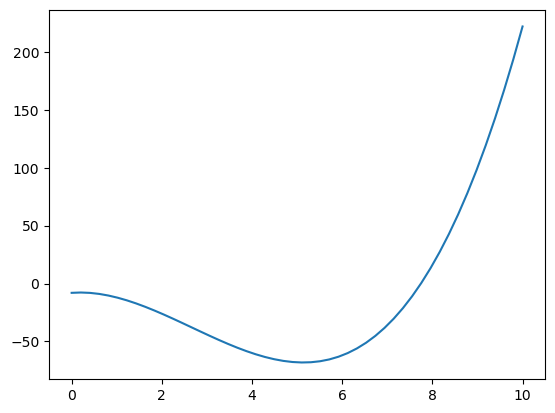

In [145]:
# Plotar uma função

# Criar uma sequência de 50 valores uniformemente espaçados entre 0 e 10
x = np.linspace(0, 10, 50)

# Definir a função f(x) = x^3 - 8x^2 + 3x - 8
f = lambda x: x**3 - 8 * x**2 + 3 * x - 8

# Calcular os valores de f(x) para cada valor de x
y = f(x)

# Plotar o gráfico da função
plt.plot(x, y, "-")  # '-' indica que o gráfico será uma linha contínua

## Limite

O conceito de limite expressa o valor retornado por uma função conforme ela se aproxima um certo valor especificado no seu domínio.

Por exemplo, na função 
$$f(x)=1/x$$
- Quanto maior o valor de $x$, mais $f(x)$ se aproxima de zero  


Dizemos então que:  
$\lim_{x \to \infty} f(x) = 0$  


Ou ainda:
- Tomando um valor real $x>0$, se calcularmos $f(x)$, quanto menor $x$, maior o valor de $f(x)$  
- $f(0)$ não está definida.


Dizemos então que:  
$\lim_{x \to 0} f(x) = \infty$



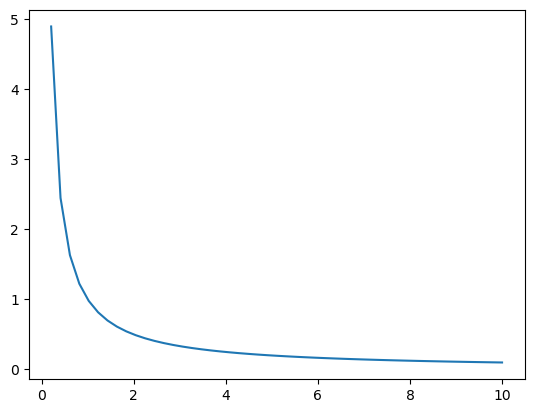

In [146]:
# Criar uma sequência de 50 valores uniformemente espaçados entre 0 e 10
x = np.linspace(0, 10, 50)

# Definir a função f(x) = 1/x
f = lambda x: 1 / x

# Calcular os valores de f(x) para cada valor de x
y = f(x)

# Plotar o gráfico da função
plt.plot(x, y, "-")  # '-' indica que o gráfico será uma linha contínua

In [147]:
# Avaliar a função f(x) = 1/x para um valor muito grande de x
f(100000000000)

1e-11

In [148]:
# Avaliar a função f(x) = 1/x para um valor muito pequeno de x (próximo de zero)
f(0.0000001)

10000000.0

## Derivada

O conceito de *derivada* de uma função é de extrema importância em matemática e em ciência de dados, pois é lançando mão dele, por exemplo, que encontramos os parâmetros de uma regressão linear através do método de mínimos quadrados, além de inúmeras outras aplicações.

A derivada de uma função avaliada em um ponto $x$ é a inclinação da reta tangente dessa função avaliada no ponto. Intuitivamente, é a reta tangente da função no ponto (x, f(x)).

|![image.png](https://upload.wikimedia.org/wikipedia/commons/thumb/f/fd/Secante_calculo.svg/280px-Secante_calculo.svg.png) | ![image-2.png](https://upload.wikimedia.org/wikipedia/commons/thumb/8/87/Derivada.svg/255px-Derivada.svg.png) |
|:-|:-|

[fonte da imagem](https://pt.wikipedia.org/wiki/Derivada)


### Brincadeira com 'h' indo para zero

Vamos construir um gráfico da função $sen(x)$, e observar graficamente a reta que liga os pontos $(x, sen(x))$ e $(x+h, sen(x)+h$, com $h$ se aproximando de zero.

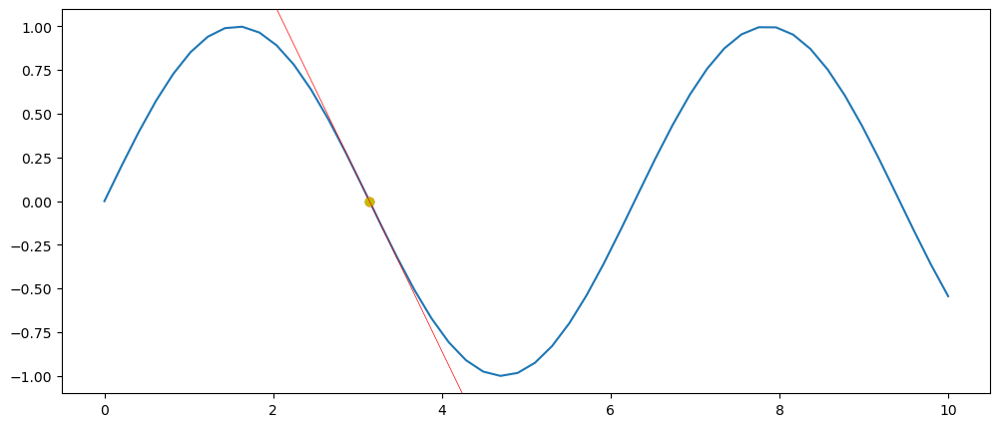

In [149]:
# Definir a figura e um sistema de eixos
fig = plt.figure(figsize=(12, 5))  # Cria uma figura com tamanho especificado
ax = plt.subplot(1, 1, 1)  # Adiciona um único sistema de eixos à figura

# Definir a função
f = lambda x: np.sin(x)  # Define a função seno

# Definir uma sequencia uniforme em x para o nosso gráfico
x = np.linspace(
    0, 10, 50
)  # Cria uma sequência de 50 valores uniformemente espaçados entre 0 e 10

# Construir o gráfico
ax.plot(x, f(x))  # Plota a função seno no intervalo definido

# Plotar um ponto x
x1 = np.pi  # Define o ponto x1 como π
p1 = (x1, f(x1))  # Calcula o ponto (x1, f(x1)) na curva
ax.plot(p1[0], p1[1], "ro")  # Plota o ponto (x1, f(x1)) como um ponto vermelho

# Plotar x+h
h = 0.0001  # Define um pequeno incremento h
x2 = x1 + h  # Calcula o ponto x2 como x1 + h
p2 = (x2, f(x2))  # Calcula o ponto (x2, f(x2)) na curva
ax.plot(p2[0], p2[1], "yo")  # Plota o ponto (x2, f(x2)) como um ponto amarelo

# Plotar secante
ax.axline(
    xy1=p1, xy2=p2, color="red", linewidth=0.5
)  # Plota a reta secante que passa pelos pontos p1 e p2

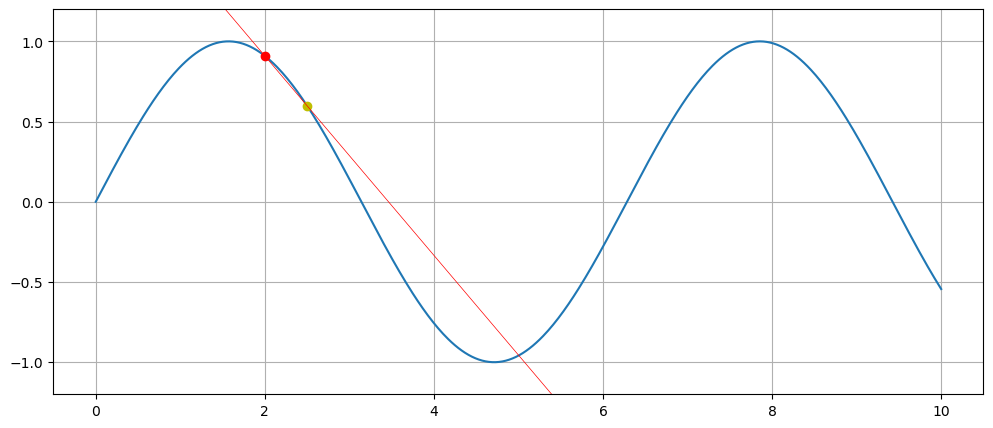

(<matplotlib.lines.Line2D at 0x1fa3407ab70>,
 <matplotlib.lines.Line2D at 0x1fa34079d60>)

In [150]:
# Definir a figura e um sistema de eixos
fig = plt.figure(figsize=(12, 5))  # Cria uma figura com tamanho especificado
ax = plt.subplot(
    1, 1, 1, ylim=(-1.2, 1.2)
)  # Adiciona um único sistema de eixos com limites no eixo y

# Definir a função
f = lambda x: np.sin(x)  # Define a função seno

# Definir uma sequência uniforme em x para o gráfico
x = np.linspace(
    0, 10, 500
)  # Cria uma sequência de 500 valores uniformemente espaçados entre 0 e 10

# Calcular f(x) para cada x da sequência acima
y = f(x)  # Calcula os valores de f(x) para cada valor de x

# Construir o gráfico
ax.plot(x, y, "-")  # Plota a função seno no intervalo definido

# Definir dois pontos para o gráfico
x1 = 2.0  # Define o ponto inicial x1
p1 = (x1, f(x1))  # Calcula o ponto (x1, f(x1)) na curva

h = 0.5  # Define o incremento h
x2 = x1 + h  # Calcula o ponto x2 como x1 + h
p2 = (x2, f(x2))  # Calcula o ponto (x2, f(x2)) na curva

# Plota os pontos p1 e p2
(pto1,) = ax.plot(p1[0], p1[1], "ro")  # Plota o ponto p1 como um ponto vermelho
(pto2,) = ax.plot(p2[0], p2[1], "yo")  # Plota o ponto p2 como um ponto amarelo

# Plota a linha que conecta os pontos p1 e p2
linha = ax.axline(
    xy1=p1, xy2=p2, color="red", linewidth=0.5
)  # Plota a reta secante entre os pontos p1 e p2

# Adiciona uma grade ao gráfico
plt.grid(True)  # Adiciona uma grade para facilitar a visualização

# Exibir o gráfico
plt.show()


# Função para atualizar os pontos e a linha
def linha_ab(delta=1, x1=2, pt1=pto1, pt2=pto2):
    """
    Atualiza os pontos e a linha secante com base no incremento delta.

    Parâmetros:
    - delta: Incremento para calcular o novo ponto x2
    - x1: Ponto inicial no eixo x
    - pt1: Objeto do ponto inicial no gráfico
    - pt2: Objeto do ponto final no gráfico
    """
    x2 = x1 + delta  # Calcula o novo x2
    y1 = f(x1)  # Calcula o valor de f(x1)
    y2 = f(x2)  # Calcula o valor de f(x2)

    # Atualiza os pontos no gráfico
    pt1.set_data([x1], [y1])  # Atualiza a posição do ponto pt1
    pt2.set_data([x2], [y2])  # Atualiza a posição do ponto pt2

    # Calcula a inclinação da reta secante
    inclinação = (y2 - y1) / delta

    # Atualiza a posição da linha secante
    linha.set_data([x1, x2], [f(x1), f(x2)])

    return (pt1, pt2)  # Retorna os pontos atualizados


# Chama a função para atualizar os pontos e a linha com delta especificado
linha_ab(delta=0.2)

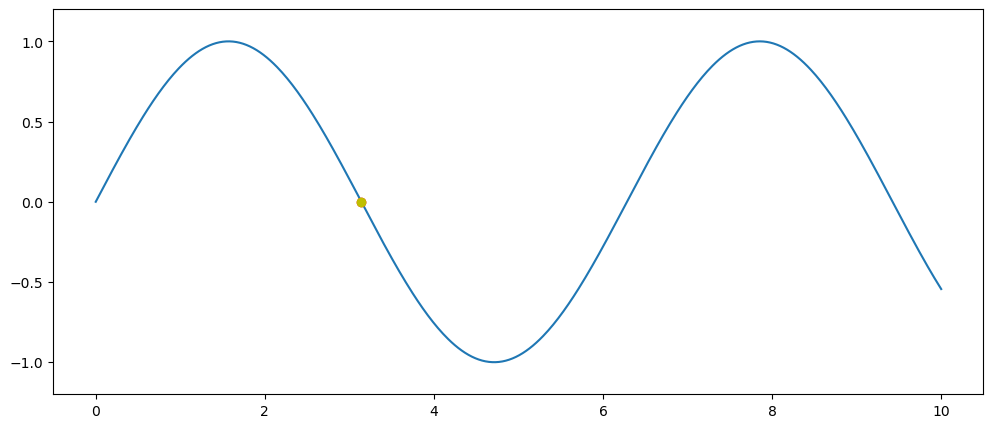

In [151]:
# Definir a figura e um sistema de eixos
fig = plt.figure(figsize=(12, 5))  # Cria uma figura com tamanho especificado
ax = plt.subplot(
    1, 1, 1, ylim=(-1.2, 1.2)
)  # Adiciona um único sistema de eixos à figura com limites no eixo y

# Definir a função
f = lambda x: np.sin(x)  # Define a função seno

# Definir uma sequência uniforme em x para o nosso gráfico
x = np.linspace(
    0, 10, 500
)  # Cria uma sequência de 500 valores uniformemente espaçados entre 0 e 10
# Calcular f(x) para cada x da sequência acima
y = f(x)  # Calcula os valores de f(x) para cada valor de x

# Construir o gráfico
ax.plot(x, y, "-")
# Plota a função seno no intervalo definido

# Definir dois pontos vazios. Esses pontos vão receber
#      (x, f(x))
#      e (x+h, f(x+h))
h = 1  # Define o incremento h
x1 = 4.5  # Define o ponto inicial x1
x2 = x1 + h  # Calcula o ponto x2 como x1 + h
p1 = (x1, f(x1))  # Calcula o ponto (x1, f(x1)) na curva

x2 = x1 + h  # Recalcula x2
p2 = (x2, f(x2))  # Calcula o ponto (x2, f(x2)) na curva

# Plota os pontos p1 e p2
(pto1,) = ax.plot(p1, "ro")  # Plota o ponto p1 como um ponto vermelho
(pto2,) = ax.plot(p2, "yo")  # Plota o ponto p2 como um ponto amarelo

# Plota a linha que conecta os pontos p1 e p2
linha = ax.axline(
    xy1=p1, xy2=p2, color="red", linewidth=0.5
)  # Plota a reta secante entre os pontos p1 e p2


# Função para atualizar os pontos e a linha
def linha_ab(delta=1, x1=2, pt1=pto1, pt2=pto2):
    x2 = x1 + delta  # Calcula o novo x2
    y1 = f(x1)  # Calcula o valor de f(x1)
    y2 = f(x2)  # Calcula o valor de f(x2)

    pt1.set_data([x1], [y1])  # Atualiza a posição do ponto pt1
    pt2.set_data([x2], [y2])  # Atualiza a posição do ponto pt2

    inclinação = (y2 - y1) / (x2 - x1)  # Calcula a inclinação da reta secante

    linha.set_data([x1, x2], [f(x1), f(x2)])  # Atualiza a posição da linha secante
    return (pt1, pt2)  # Retorna os pontos atualizados


# Chama a função para atualizar os pontos e a linha com delta pequeno e x1 definido
linha_ab(delta=0.001, x1=np.pi)
# Atualiza os pontos e a linha para x1 = π e delta = 0.001
plt.show()

### Animação com 'h' indo para zero

Com base na função acima, vamos produzir uma animação com o ```matplotlib.animation```. 

In [152]:
%%time  

# Define o número total de frames para a animação
n_frames = 100

# Função para desenhar cada frame da animação
# 'n' é o índice do frame atual
# 'num' é o número total de frames (padrão é n_frames)
# 'hmax' é o valor máximo de h (padrão é 1)
def desenha_frame(n, num=n_frames, hmax=1):
    # Calcula o valor de delta para o frame atual, diminuindo linearmente de hmax até 0
    return (linha_ab(delta=hmax - n*hmax/(n_frames+.1)))

# Cria a animação com a função definida acima
# 'frames' define o número total de frames
# 'interval' define o intervalo entre os frames em milissegundos
# 'blit=True' otimiza a renderização, redesenhando apenas os elementos que mudaram
anim = FuncAnimation(fig, desenha_frame, frames=n_frames, interval=20, blit=True)

# Exibe a animação no formato HTML
HTML(anim.to_jshtml())

CPU times: total: 4.7 s
Wall time: 4.71 s


### Brincadeira plotando $f(x)$ e $f'(x)$ com $f = seno$

A próxima célula plota a função $sen(x)$ e a sua derivada ($cos(x)$), realçando o valor da função, a reta tangente e o valor da derivada.

CPU times: total: 15.6 ms
Wall time: 22.5 ms


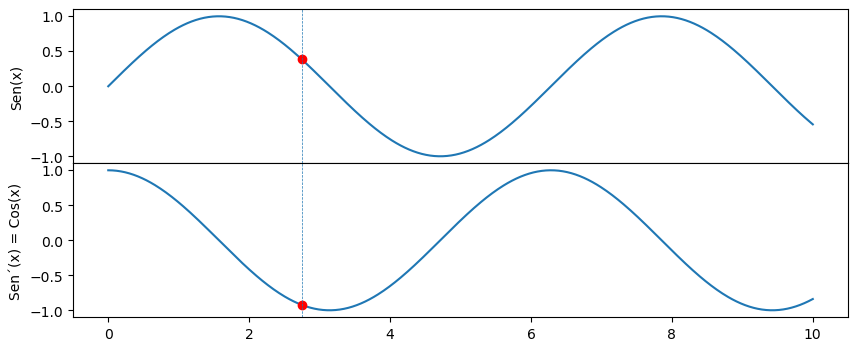

In [153]:
%%time
# Definir a figura e um sistema de eixos com dois gráficos (um acima do outro)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 4))  # Cria uma figura com dois subplots
plt.subplots_adjust(hspace=0)  # Ajusta o espaçamento vertical entre os subplots

# Definir a função seno e sua derivada (cosseno)
f = lambda x: np.sin(x)  # Função seno
flinha = lambda x: np.cos(x)  # Derivada da função seno (cosseno)

# Criar uma sequência uniforme de valores para x
x = np.linspace(0, 10, 500)  # 500 valores uniformemente espaçados entre 0 e 10
# Calcular os valores de f(x) (seno) para cada x
y = f(x)

# Construir os gráficos
ax1.plot(x, y, '-')  # Gráfico da função seno
ax2.plot(x, flinha(x))  # Gráfico da derivada (cosseno)

# Adicionar rótulos aos eixos verticais
ax1.set_ylabel('Sen(x)')  # Rótulo do eixo y no primeiro gráfico
ax2.set_ylabel('Sen´(x) = Cos(x)')  # Rótulo do eixo y no segundo gráfico

# Definir um pequeno incremento h e os pontos x1 e x2
h = .0001  # Incremento pequeno
x1 = 0  # Ponto inicial
x2 = x1 + h  # Ponto deslocado por h

# Adicionar um ponto no gráfico do seno e uma linha tangente
p1, = ax1.plot([x1], [f(x1)], 'ro')  # Ponto vermelho no gráfico do seno
linha, = ax1.plot([x1, x2], [f(x1), f(x2)], color="red", linewidth=0.5)

# Adicionar um ponto no gráfico da derivada
plinha, = ax2.plot([x1], [flinha(x1)], 'ro')  # Ponto vermelho no gráfico do cosseno

# Adicionar linhas verticais de referência em ambos os gráficos
linhav1 = ax1.axvline(x1, linewidth=.5, linestyle='--')  # Linha vertical no gráfico do seno
linhav2 = ax2.axvline(x1, linewidth=.5, linestyle='--')  # Linha vertical no gráfico do cosseno

# Função para atualizar os elementos do gráfico para animação
def linha_ab(delta=.0001, x1=4.5, p1_=p1, p2_=p2, plin=plinha):
    # Dado o ponto x1, calcula a derivada para um pequeno delta
    x2 = x1 + delta  # Calcula o ponto deslocado por delta
    
    # Atualiza as linhas verticais de acordo com x1
    linhav1.set_data([x1, x1], [0, 1])  # Atualiza a linha vertical no gráfico do seno
    linhav2.set_data([x1, x1], [0, 1])  # Atualiza a linha vertical no gráfico do cosseno
    
    # Atualiza os pontos de referência de acordo com x1
    p1_.set_data([x1], [f(x1)])  # Atualiza o ponto no gráfico do seno
    plin.set_data([x1], [flinha(x1)])  # Atualiza o ponto no gráfico do cosseno
    
    # Calcula a inclinação da reta tangente
    inclinação = (f(x2) - f(x1)) / (x2 - x1)
    
    # Atualiza a posição da reta tangente de acordo com x1
    linha.set_data([x1, x2], [f(x1), f(x2)])
    return linhav1, linhav2  # Retorna as linhas verticais atualizadas

# Chama a função para atualizar os elementos do gráfico com x1 inicial
l = linha_ab(x1=1.75 * np.pi / 2)

In [154]:
%%time  

# Define o número total de frames para a animação
total_frames = 200

# Função para desenhar cada frame da animação
def desenha_frame(n, tot_frames = total_frames):
    # Calcula o valor de x1 para o frame atual, variando de 0 a 10
    x1_ = 10 * n / total_frames
    # Atualiza os pontos e a linha tangente com base no valor de x1
    return linha_ab(delta=.001, x1=x1_, p1_=p1, p2_=p2)

# Cria a animação com a função definida acima
# 'frames' define o número total de frames
# 'interval' define o intervalo entre os frames em milissegundos
# 'blit=True' otimiza a renderização, redesenhando apenas os elementos que mudaram
anim = FuncAnimation(fig, desenha_frame, frames=total_frames, interval=20, blit=True)

# Exibe a animação no formato HTML
HTML(anim.to_jshtml())

CPU times: total: 14.5 s
Wall time: 14.7 s


### Definição

Podemos definir a derivada de $f(x)$ como:

$$ f'(x) = \lim_{h \to 0} \frac{f(x+h) - f(x)}{h} $$

**Algumas técnicas de derivação**

Nesta aula vamos trabalhar com os principais conceitos intuitivos do cálculo, e suas principais aplicações em ciência de dados, mas os principais resultados podem ser consultados obviamente em um bom livro de cálculo, como na [wikipedia](https://en.wikipedia.org/wiki/Differentiation_rules) ou até em cheat sheets que podem ser encontrados online.

- Regra da cadeia:  
$(f(g(x)))' = f'(g(x))g'(x)$


- Derivada de uma soma de funções:  
Se  
$f(x) = f_1(x) + f_2(x)$  
Então
$f'(x) = f_1'(x) + f_2'(x) $


- Quando a função não depende de $x$, a sua derivada (em relação a $x$) é zero:  
$f(x) = 3 \Rightarrow f'(x) = 0$  
ex:  
$f(x) = y^2 \Rightarrow f'(x) = 0$  


- Derivada de uma combinação linear:  
$ \left(a + bf(x)\right)' = b.f'(x) $


- Derivada de $\frac{1}{x}$ - segue a regra da potência de $x$:  
$(\frac{1}{x})' = x^a$ com a=-1:  
$(x^{-1})' = -1.x^{-2}$  


- Polinômio de primeiro grau:  
$f(x) = ax + b \Rightarrow f'(x) = (ax)' + (b)' = a $  
ex:  
$f(x) = 3x + 10 \Rightarrow f'(x) = 3$  


- Polinômio de segundo grau:  
$f(x) = ax^2 + bx + c \Rightarrow 2ax + b $  
ex:  
$f(x) = 3x + 10 \Rightarrow f'(x) = 3$  


- Derivada de potência de x:  
$f(x) = ax^b \Rightarrow ab.x^{b-1}$


- Derivadas trigonométricas básicas:  
$sin(x)' = cos(x)$  
$cos(x)' = -sen(x)$


- Função exponencial:  
$(e^x)' = e^x$


- Logaritmo natural:  
$ln(x)' = \frac{1}{x}$

<Axes: xlabel='x', ylabel='y'>

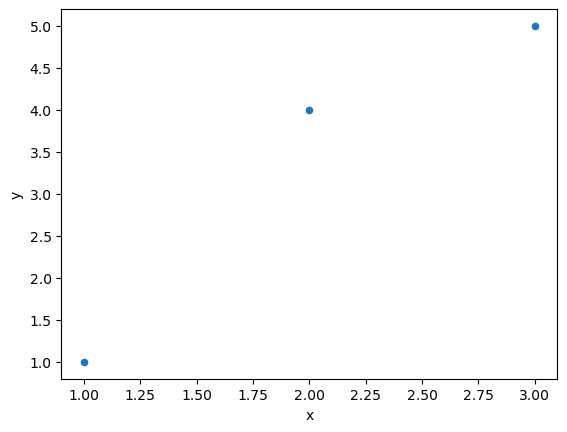

In [155]:
df = pd.DataFrame({"x": [1, 2, 3], "y": [1, 4, 5]})
df.plot.scatter("x", "y")

### Derivadas parciais


**Aplicação**

Uma ferramenta como estas possui inúmeras aplicações, para citar uma classe ampla delas, se queremos achar um ponto de máximo ou de mínimo em uma função, esse ponto terá uma derivada igual a zero. Daí, podemos escrever um modelo de regressão por exemplo, escrever a equação dos erros de previsão desse modelo em função dos parâmetros, e tentar encontrar para qual conjunto de parâmetros essa função tem derivada igual a zero - isso nos dá o chamado estimador de mínimos quadrados.

<div>
<img src="attachment:image.png" width="600"/>
</div>

Nem toda função é derivável. Algumas funções vão admitir mais de uma reta que passa por (x, f(x)) com inclinações diferentes.

Uma demonstração disso está disponível na [wikipedia](https://pt.wikipedia.org/wiki/M%C3%A9todo_dos_m%C3%ADnimos_quadrados)


Vamos tomar como exemplo uma regressão na base de gorjetas, explicando a variável ```tip``` com a variável explicativa ```net_bill```. Considere a função da soma de quadrados do erro dessa regressão como uma função de $\alpha$ e $\beta$.


### Exemplo visual
Vamos tomar como exemplo uma regressão na base de gorjetas, explicando a variável ```tip``` com a variável explicativa ```net_bill```. Considere a função da soma de quadrados do erro dessa regressão como uma função de $\alpha$ e $\beta$.

Vamos então importar a base de gorjetas e dar uma olhadela na regressão mencionada feita pelo statsmodels.

In [156]:
# Importar as bibliotecas necessárias
import seaborn as sns  # Biblioteca para visualização de dados e carregamento de datasets
import statsmodels.formula.api as smf  # Biblioteca para modelagem estatística

# Carregar o dataset 'tips' do seaborn
df = sns.load_dataset("tips")

# Criar uma nova coluna 'net_bill', que é o total da conta menos a gorjeta
df["net_bill"] = df["total_bill"] - df["tip"]

# Ajustar um modelo de regressão linear simples com a variável dependente 'tip' e a variável independente 'net_bill'
reg = smf.ols("tip ~ net_bill", data=df).fit()

# Obter o resumo dos resultados do modelo ajustado
resumo_reg = reg.summary()

# Exibir o resumo do modelo
resumo_reg

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    tip   R-squared:                       0.333
Model:                            OLS   Adj. R-squared:                  0.330
Method:                 Least Squares   F-statistic:                     120.6
Date:                Mon, 05 May 2025   Prob (F-statistic):           5.02e-23
Time:                        13:05:47   Log-Likelihood:                -375.63
No. Observations:                 244   AIC:                             755.3
Df Residuals:                     242   BIC:                             762.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.3307      0.168      7.907      0.000       0.999       1.662
net_bill       0.0993      0.009     10.980      0.000       0.082       0.117
==============================================================================
Omnibus:                       33.873   Durbin-Watson:                   2.123
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               59.942
Skew:                           0.754   Prob(JB):                     9.63e-14
Kurtosis:                       4.903   Cond. No.                         43.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Vamos 'brincar' um pouco com a função da soma de quadrados do modelo:

In [157]:
# Seleciona a coluna 'tip' do DataFrame como a variável dependente y
y = df["tip"]

# Seleciona a coluna 'net_bill' do DataFrame como a variável independente x
x = df["net_bill"]


# Define uma função para calcular a soma dos quadrados dos erros (SQM)
# y: valores reais
# y_hat: valores previstos
def calcula_sqm(y, y_hat):
    return (
        (y - y_hat) ** 2
    ).sum()  # Retorna a soma dos quadrados das diferenças entre y e y_hat


# Define os valores iniciais para os coeficientes do modelo linear
a = 1.3307  # Intercepto
b = 0.0993  # Coeficiente angular

# Calcula a soma dos quadrados dos erros (SQM) para o modelo linear com os coeficientes definidos
calcula_sqm(y, a + b * x)

310.510475046591

Agora vamos montar um grid para calcular o erro quadrático médio na base de gorjetas, para diferentes combinações de $\alpha$ e $\beta$.

In [158]:
# Definir os limites para o parâmetro alpha
alpha_min = 0.3  # Valor mínimo de alpha
alpha_max = 2.3  # Valor máximo de alpha
n_bins = 20  # Número de divisões (bins) para o grid de alpha
delta1 = (alpha_max - alpha_min) / n_bins  # Incremento entre os valores de alpha

# Definir os limites para o parâmetro beta
beta_min = 0.045  # Valor mínimo de beta
beta_max = 0.15  # Valor máximo de beta
delta2 = (beta_max - beta_min) / n_bins  # Incremento entre os valores de beta

# Criar o grid para calcular o EQM (Erro Quadrático Médio) em função de alpha e beta
grid_alpha = np.arange(alpha_min, alpha_max, delta1)  # Valores de alpha no grid
grid_beta = np.arange(beta_min, beta_max, delta2)  # Valores de beta no grid

Vamos calcular a soma dos quadrados dos erros do modelo (SQM) para cada combinação de $\alpha$ e $\beta$ agora.

In [159]:
%%time

# Listas vazias que vão armazenar os valores de alpha, beta e o erro quadrático médio (EQM)
i_alpha = []  # Lista para armazenar os valores de alpha
i_beta = []   # Lista para armazenar os valores de beta
i_eqm = []    # Lista para armazenar os valores de EQM

# Loop para percorrer todos os valores de alpha no grid
for alpha in grid_alpha:
    # Loop para percorrer todos os valores de beta no grid
    for beta in grid_beta:
        # Calcula os valores previstos (yhat) com base no modelo linear y = alpha + beta * x
        yhat = alpha + beta * x
        
        # Adiciona o valor atual de alpha à lista i_alpha
        i_alpha.append(alpha)
        # Adiciona o valor atual de beta à lista i_beta
        i_beta.append(beta)
        # Calcula o EQM para os valores reais (y) e previstos (yhat) e adiciona à lista i_eqm
        i_eqm.append(calcula_sqm(y, yhat))

# Cria um DataFrame vazio com 3 colunas: 'alpha', 'beta' e 'eqm'
grid = pd.DataFrame(np.empty((len(grid_alpha) * len(grid_beta), 3)), columns=['alpha', 'beta', 'eqm'])

# Preenche a coluna 'alpha' do DataFrame com os valores armazenados em i_alpha
grid.alpha = i_alpha
# Preenche a coluna 'beta' do DataFrame com os valores armazenados em i_beta
grid.beta = i_beta
# Preenche a coluna 'eqm' do DataFrame com os valores armazenados em i_eqm
grid.eqm = i_eqm

CPU times: total: 844 ms
Wall time: 108 ms


In [160]:
grid

,alpha,beta,eqm
0,0.3,0.04500,1277.798676
1,0.3,0.05025,1187.620275
2,0.3,0.05550,1102.096845
3,0.3,0.06075,1021.228386
4,0.3,0.06600,945.014898
...,...,...,...
395,2.2,0.12375,719.123955
396,2.2,0.12900,780.489108
397,2.2,0.13425,846.509231
398,2.2,0.13950,917.184326


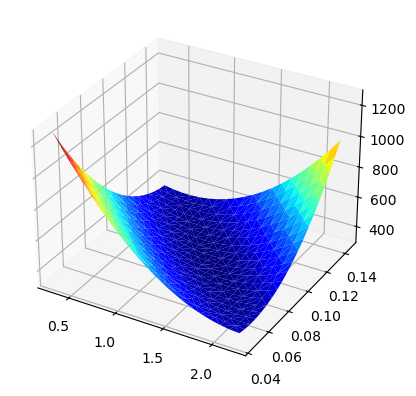

In [166]:
# Esta célula não funciona no Jupyter Notebook padrão, mas funciona no JupyterLab aparentemente

%matplotlib inline

from mpl_toolkits.mplot3d import Axes3D  # Importa ferramentas para criar gráficos 3D
from matplotlib import cm  # Importa o módulo de mapas de cores (colormaps)

# Cria uma nova figura para o gráfico
fig = plt.figure()

# Adiciona um sistema de eixos 3D à figura
ax = fig.add_subplot(111, projection='3d')

# Plota uma superfície 3D usando os valores de alpha, beta e eqm do DataFrame 'grid'
# - 'grid.alpha', 'grid.beta' e 'grid.eqm' são as coordenadas x, y e z, respectivamente
# - 'cmap=cm.jet' define o mapa de cores usado para colorir a superfície
# - 'linewidth=0.2' define a largura das linhas na superfície
ax.plot_trisurf(grid.alpha, grid.beta, grid.eqm, cmap=cm.jet, linewidth=0.2)

# Exibe o gráfico
plt.show()

In [162]:
# Substituta para o gráfico que deveria ser feito com matplotlib
# Importa as bibliotecas necessárias
import plotly.graph_objects as go  # Biblioteca para criar gráficos interativos
import pandas as pd  # Biblioteca para manipulação de dados

# Cria uma figura 3D interativa usando Plotly
fig = go.Figure(
    data=[
        go.Mesh3d(
            x=grid.alpha,  # Define os valores do eixo X (parâmetro alpha)
            y=grid.beta,  # Define os valores do eixo Y (parâmetro beta)
            z=grid.eqm,  # Define os valores do eixo Z (Erro Quadrático Médio - EQM)
            colorscale="Jet",  # Define o mapa de cores para a superfície
            intensity=grid.eqm,  # Define a intensidade das cores com base no EQM
            showscale=True,  # Exibe a barra de escala de cores
            opacity=0.8,  # Define a opacidade da superfície
        )
    ]
)

# Atualiza o layout do gráfico
fig.update_layout(
    scene=dict(
        xaxis_title="Alpha",  # Título do eixo X
        yaxis_title="Beta",  # Título do eixo Y
        zaxis_title="EQM",  # Título do eixo Z
    ),
    title="Superfície 3D Interativa com Plotly",  # Título do gráfico
)

# Exibe o gráfico interativo
fig.show()

Vamos dar um zoom nassa função para observar melhor os menores valores:

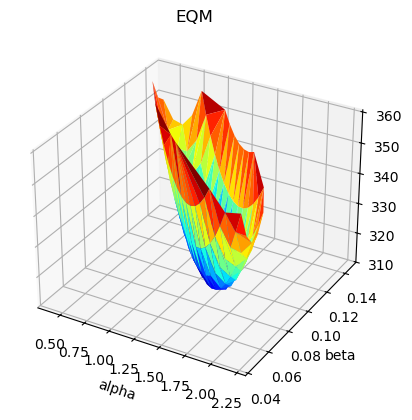

In [163]:
%matplotlib inline

grid_select = grid[grid.eqm < 360]

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax = Axes3D(fig)

ax.plot_trisurf(grid_select.alpha, 
                grid_select.beta, 
                grid_select.eqm, cmap=cm.jet, linewidth=0.2)

plt.xlabel('alpha')
plt.ylabel('beta')
plt.title('EQM')
plt.grid(True)  # Adiciona uma grade ao gráfico

plt.show()

Vamos visualizar agora a função do SQM em função de alpha e beta:

## Integral

Na história da matemática, creio que não há muitos conceitos com impactos tão profundos na ciência e na sociedade como a derivada e a integral (que são intimamente relacionadas). Em ciência de dados, para citar um exemplo, podemos elencar o cálculo de probabilidades - que veremos em mais detalhes adiante.

O conceito de integral está associado com a área abaixo de uma função em um determinado segmento de x (domínio). As primeiras ideias estão relacionadas a dividir o eixo x em segmentos, obtendo retângulos cujo cálculo da área é relativamente fácil ($\Delta x$ a dimensão da base e $f(x)$ a dimensão da altura). Conforme vamos aumentando o número de segmentos, vai diminuindo o tamanho do $\Delta x$. Esse conceito é chamado de *integral de Riemann* e está ilustrado belamente na figura abaixo, extraída da wikipedia.




|![image.png](https://upload.wikimedia.org/wikipedia/commons/thumb/0/0a/Riemann_Integration_and_Darboux_Upper_Sums.gif/300px-Riemann_Integration_and_Darboux_Upper_Sums.gif) | ![image-2.png](https://upload.wikimedia.org/wikipedia/commons/thumb/e/e3/Riemann_Integration_and_Darboux_Lower_Sums.gif/300px-Riemann_Integration_and_Darboux_Lower_Sums.gif) |
|:-|:-|

[fonte das imagens](https://en.wikipedia.org/wiki/Integral)


Conforme diminuímos o tamanho do segmento, no limite, chegamos na definição de integral abaixo:
$$ \int_{0}^{a} f(x) dx = \lim_{\Delta x\to 0}\sum_{i=0}^{n} f(x_i^*)\Delta x $$

Nesse contexto, definimos $F(x)$ como a *anti-derivada* ou a *primitiva* de $f(x)$ sendo que:

$$ F'(x) = f(x) $$

![imagem](https://upload.wikimedia.org/wikipedia/commons/2/2f/Fundamental_theorem_of_calculus_%28animation%29.gif)

<BarContainer object of 51 artists>

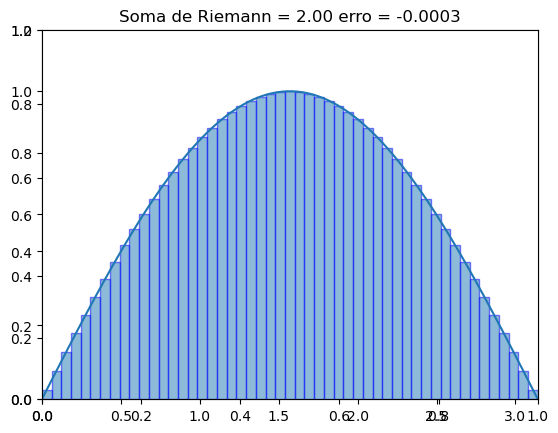

In [ ]:
warnings.filterwarnings("ignore")  # Ignora avisos de bibliotecas para evitar poluição no output

# Define a função seno de x
f = lambda x: np.sin(x)

# Função para calcular a área aproximada sob a curva usando a soma de Riemann
def calcula_area(a, b, func, frame_num):
    num_bins = frame_num + 1  # Define o número de retângulos (bins) com base no frame atual
    delta = (b - a) / num_bins  # Calcula a largura de cada retângulo
    x_cols = np.linspace(a, b - delta, num_bins) + delta / 2  # Define os centros dos retângulos no eixo X
    y_cols = f(x_cols)  # Calcula as alturas dos retângulos com base na função
    return sum(delta * y_cols)  # Retorna a soma das áreas dos retângulos

# Função para animar o gráfico da soma de Riemann
def animate(n, a=0, b=np.pi, func=f, verdadeiro_valor=2):
    plt.cla()  # Limpa o gráfico anterior para preparar o próximo frame
    ax = plt.axes(xlim=(a, b), ylim=(0, 1.2))  # Define os limites do sistema de eixos

    # Plota a função contínua
    x = np.linspace(a, b, 100)  # Gera 100 pontos uniformemente espaçados entre a e b
    y = f(x)  # Calcula os valores da função para os pontos gerados
    ax.plot(x, y, "-")  # Plota a curva da função

    # Define os retângulos para a soma de Riemann
    num_bins = n + 1  # Define o número de retângulos (bins) com base no frame atual
    delta = (b - a) / num_bins  # Calcula a largura de cada retângulo
    x_cols = np.linspace(a, b - delta, num_bins) + delta / 2  # Define os centros dos retângulos no eixo X
    y_cols = f(x_cols)  # Calcula as alturas dos retângulos com base na função

    # Plota os retângulos no gráfico
    bar = ax.bar(x_cols, y_cols, alpha=0.5, width=delta, edgecolor="blue")  # Plota as barras com transparência

    # Calcula a soma de Riemann (área aproximada sob a curva)
    soma_riemann = calcula_area(a, b, func, n)

    # Calcula o erro em relação ao valor verdadeiro da integral
    erro = verdadeiro_valor - soma_riemann
    ax.set_title(f"Soma de Riemann = {soma_riemann:.2f} erro = {erro:.4f}")  # Define o título do gráfico com os valores calculados

    return bar  # Retorna as barras para serem usadas na animação

# Chama a função animate para o frame 50 (não está animando, apenas gerando um frame estático)
animate(50)


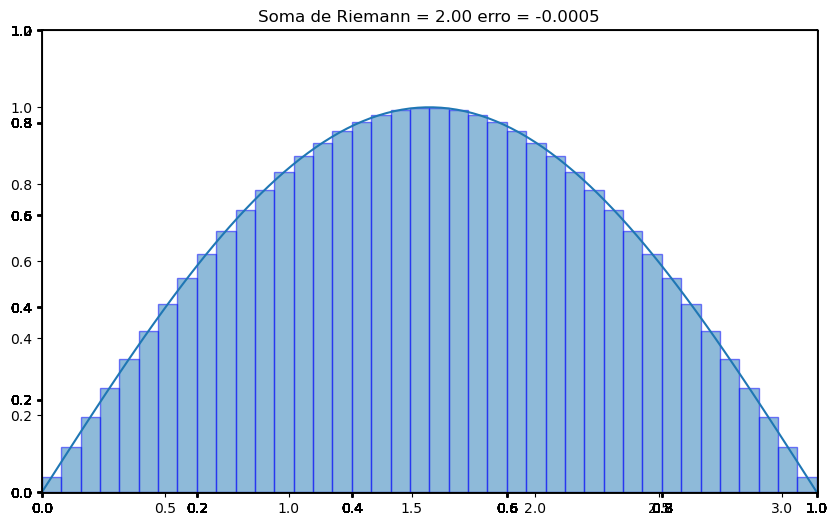

In [165]:
%matplotlib inline

fig = plt.figure(figsize=(10, 6))  # make a new figure
ax = plt.subplot(1,1,1)   

ani = FuncAnimation(fig, animate, frames=40, interval=120, blit=True)
# ani.save('riemann_sum2.gif',writer="imagemagick")
HTML(ani.to_jshtml())

- A função integral de uma função:

A função integral é a "anti-derivada". É a função tal que, se você derivar, dá a mesma função.

De uma forma um pouco mais formal, a integral de $f(x)$ em relação a $x$ é a própria $f(x)$.

$\int f(x) dx = F(x) \Rightarrow F'(x) = f(x)$ 

- Integral definida:

A integral definida é aquela que retorna uma área. Por exemplo, integral de $a$ a $b$ de $f(x)$ fornece a área da função $f(x)$ entre os pontos $a$ e $b$. Isso pode ser escrito assim:

$\int_{a}^{b} f(x) dx = F(b) - F(a)$

Avaliando esta equação obtemos a área sob a curva $f(x)$ entre os pontos a e b.

## Referências

- Construindo gráficos 3d com matplotlib: Esse link tem instruções interessantes sobre como fazer gráficos 3d no python, caso você se interesse, vale dar uma olhada [link](https://www.youtube.com/watch?v=gqoLLGgbeAE)
- Construindo animações com o matplotlib: Fazer animações pode não ser trivial, se você precisar de mais instruções, pode valer a pena olhar este [link](https://www.youtube.com/watch?v=7RgoHTMbp4A)
- 3blue1brown - "a essência do cálculo": Esse canal é muito interessante, ele produz videos com animações muito legais sobre matemática e tem uma playlist altamente recomendável para quem quer entender um pouco mais sobre cálculo, ou simplesmente gosta do assunto [link](https://www.youtube.com/watch?v=WUvTyaaNkzM)
- Artigo sobre derivada da [Wikipedia](https://en.wikipedia.org/wiki/Derivative)
- Artigo sobre integral da [Wikipedia](https://en.wikipedia.org/wiki/Integral)
- Livros sobre cálculo:
    - Há diversos livros sobre o assunto, esse link fala um pouco de alguns deles: [link](https://book360.com.br/melhores-livros-de-calculo-para-universitarios/)
    - Eu usei essa série na minha graduação: "Um Curso de Cálculo - Vol. 1: Volume 1" por  Hamilton Luiz GUIDORIZZI